## Visão Computacional 2021.2 - Projeto final - Lucas Chen Alba

PROJETO II - 14/12/2021
Projetar e implementar uma solução baseada em Visão Computacional para um problema prático. Sua solução deve envolver:

pelo menos um algoritmo de reconstrução ou percepção 3D (imagem ou vídeo)

pelo menos um algoritmo de reconhecimento de padrões

pelo menos um algoritmo de processamento de imagens

O projeto deverá ser entregue no formato de notebook, onde deverá ser descrito 
o problema que está sendo resolvido e a solução proposta. Cada aluno ou grupo terá 10 minutos para apresentar o seu projeto na aula de 14/12.

O projeto será avaliado com base na relevância do problema (20%), qualidade da solução (60%) e apresentação (20%).

Usar detecção de pessoas (rede neural e/ou reconhecimento de padrão) para checar se existe uma pessoa na imagem

Aplicar a visão 3d para checar se a pessoas está próxima à camera (https://www.youtube.com/watch?v=t3LOey68Xpg, https://github.com/niconielsen32/ComputerVision/tree/master/StereoVisionDepthEstimation)

Mapas de profundidade para saber se a pessoa está perto

In [ ]:
!pip install tensorflow-object-detection-api

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# from Worker import Worker

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
tf.get_logger().setLevel('INFO')           # Suppress TensorFlow logging (2)
tf.autograph.set_verbosity(1)
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
import logging
tf.get_logger().setLevel(logging.ERROR)
from numpy.core.records import fromarrays
from object_detection.utils import label_map_util
from shapely.geometry.polygon import Polygon
from shapely.geometry import Point
import numpy as np
import time
import PIL
import sys
import imutils
import glob
from matplotlib import pyplot as plt

Change with tf.gfile to with tf.io.gfile

In [ ]:
'''
focal length: 18.9 mm
horizontal field of view: 87.1º
https://www.camerafv5.com/devices/manufacturers/xiaomi/mi_a3_laurel_sprout_0/
'''

'\nfocal length: 18.9 mm\nhorizontal field of view: 87.1º\nhttps://www.camerafv5.com/devices/manufacturers/xiaomi/mi_a3_laurel_sprout_0/\n'

In [ ]:



class Worker:
    def __init__(self, threshold, model_name, model_date, label_filename):
        self.threshold = threshold
        self.model_name = model_name
        self.model_date = model_date
        self.model_fn = None
        self.label_filename = label_filename
        self.category_index = None
        Worker.label_map(self)
        self.boxes = np.array([])
        self.classes = []
        self.scores = []
        self.class_name = 'person'
        self.image_shape = []
        self.detect_dict = {'IN': [], 'OUT': []}

    def _download_model(self):
        base_url = ('http://download.tensorflow.org/models/object_detection/tf2/')
        model_file = self.model_name + '.tar.gz'
        model_dir = tf.keras.utils.get_file(fname=self.model_name,
                                            origin=base_url + self.model_date +
                                            '/' + model_file,
                                            untar=True)
        print('Model dir: ', model_dir)
        return str(model_dir)

    def load_models(self):
        '''Downloads and loads TF2 model'''
        # Enable GPU dynamic memory allocation
        gpus = tf.config.experimental.list_physical_devices('GPU')
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

        # Download model
        print('Downloading model... ')
        PATH_TO_MODEL_DIR = self._download_model()
        print('Done downloading')

        print('Loading model... ')
        start_time = time.time()

        # Load the downloaded model and build the detection function
        PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + '/saved_model'
        detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

        end_time = time.time()
        print('Done loading! Took {} seconds'.format(end_time - start_time))
        self.model_fn = detect_fn

    def _download_labels(self):
        '''Download detection labels file'''
        base_url = ('https://raw.githubusercontent.com/tensorflow/models/'
                    'master/research/object_detection/data/')
        label_dir = tf.keras.utils.get_file(fname=self.label_filename,
                                            origin=base_url +
                                            self.label_filename,
                                            untar=False)
        label_dir = pathlib.Path(label_dir)
        return str(label_dir)

    def label_map(self):
        '''Load label map data (for plotting)'''
        PATH_TO_LABELS = self._download_labels()
        self.category_index = label_map_util.create_category_index_from_labelmap(
            PATH_TO_LABELS,
            use_display_name=True)

    def _clear_dict(self):
        '''Clear detection_dict'''
        self.detect_dict['IN'] = []
        self.detect_dict['OUT'] = []

    def _filter_class(self):
        '''
        Removes all detected objects except "person"
        '''
        # Find the idx of the category
        for i in self.category_index:
            if self.category_index[i]['name'] == self.class_name:
                category = i
        # Change to zero all categories that are not the filtered class
        elim = self.classes == category
        elim = elim.astype(np.int64)
        self.classes = np.multiply(self.classes, elim)
        # Replicate the columns by 4 to multiply with boxes
        # Eliminate the ones that do not correspond to chosen category
        mut = np.array([self.classes]*4).transpose()
        mut = np.multiply(self.boxes, mut)
        self.boxes = mut[~np.all(mut == 0, axis=1)]
        # Get index of the elements that represent the chosen category
        idx = np.argwhere(1 - self.classes)
        self.classes = np.delete(self.classes, idx)
        self.scores = np.delete(self.scores, idx)

    def _filter_detections(self):
        '''Removes all detections with scores below the defined threshold'''
        self.boxes = np.array([self.boxes[x] for x in range(len(self.boxes))
                               if self.scores[x] >= self.threshold])
        self.classes = np.array([self.classes[x]
                                 for x in range(len(self.classes))
                                 if self.scores[x] >= self.threshold])
        self.scores = np.array([x for x in self.scores if x >= self.threshold])


    def _transform_boxes(self):
        '''Transforms boxes from percentage scale to pixel scale'''
        sizes = np.array([self.image_shape[0], self.image_shape[1],
                          self.image_shape[0], self.image_shape[1]])
        self.boxes = np.rint(np.multiply(self.boxes, sizes)).astype(np.int64)


    def compute(self, image_path):
        '''
        Gets detecion from TF2 model and makes predictions
        of intruders
        '''
        self._clear_dict()
        if (type(image_path) == str):
            # keras.preprocessing.image.load_img takes a path
            img = tf.keras.preprocessing.image.load_img(image_path)

        else:
            print("Image PIL:", type(image_path))
            # PIL.Image.fromarray takes a ndarray image
            img = PIL.Image.fromarray(image_path)

        img_np = np.array(img)
        self.image_shape = img_np.shape
        print('Image shape:', self.image_shape)
        input_tensor = tf.convert_to_tensor(img_np)
        input_tensor = input_tensor[tf.newaxis, ...]

        detections = self.model_fn(input_tensor)
        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy()
                      for key, value in detections.items()}
        detections['num_detections'] = num_detections
        detections['detection_classes'] = detections[('detection_classes'
                                                      )].astype(np.int64)


        detections['detection_classes'] = detections[('detection_classes'
                                                      )].astype(np.int64)
        self.classes = detections['detection_classes']
        self.boxes = detections['detection_boxes']
        self.scores = detections['detection_scores']

        self._filter_detections()
        if(self.boxes.size == 0):
            print('No detections above selected threshold')
            return

        self._filter_class()
        self._transform_boxes()
        
        return self.boxes

        # print('\nComputing...')


In [ ]:
def _draw_bounding():
    # Draw bounding boxes on detected person
    cv2.rectangle(img, (int(box[1]), int(box[0])),
                    (int(box[3]), int(box[2])), (0, 255, 0), 2)

def save_image(output_name):
    # Save image into output_name file/directory
    cv2.imwrite(output_name, img)


def draw_fn(img, box):
    # draw boxes, information and limit to image
    img = cv2.imread(img)

    print(box)
    print((int(box[1]), int(box[0])), (int(box[3]), int(box[2])))
    cv2.rectangle(img, (int(box[1]), int(box[0])), (int(box[3]), int(box[2])), (0, 255, 0), 2)
    return img


In [ ]:

def calibrate_cameras():
    ################ FIND CHESSBOARD CORNERS - OBJECT POINTS AND IMAGE POINTS #############################
    chessboardSize = (9,6)
    frameSize = (640,480)

    # termination criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((chessboardSize[0] * chessboardSize[1], 3), np.float32)
    objp[:,:2] = np.mgrid[0:chessboardSize[0],0:chessboardSize[1]].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpointsL = [] # 2d points in image plane.
    imgpointsR = [] # 2d points in image plane.


    imagesLeft = glob.glob('images/stereoLeft/*.jpg')
    imagesRight = glob.glob('images/stereoRight/*.jpg')

    for imgLeft, imgRight in zip(imagesLeft, imagesRight):
        print('finding corners')
        imgL = cv2.imread(imgLeft)
        imgR = cv2.imread(imgRight)
        print('read images')
        grayL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
        grayR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)

        # Find the chess board corners
        retL, cornersL = cv2.findChessboardCorners(grayL, chessboardSize, None)
        retR, cornersR = cv2.findChessboardCorners(grayR, chessboardSize, None)
        print(retL, retR)

        # If found, add object points, image points (after refining them)
        if retL and retR == True:
            print('found corners')

            objpoints.append(objp)

            cornersL = cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
            imgpointsL.append(cornersL)

            cornersR = cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
            imgpointsR.append(cornersR)

            # Draw and display the corners
            cv2.drawChessboardCorners(imgL, chessboardSize, cornersL, retL)
            cv2_imshow('img left', imgL)
            cv2.drawChessboardCorners(imgR, chessboardSize, cornersR, retR)
            cv2_imshow('img right', imgR)
            cv2.waitKey(1000)

    ############## CALIBRATION #######################################################

    retL, cameraMatrixL, distL, rvecsL, tvecsL = cv2.calibrateCamera(objpoints, imgpointsL, frameSize, None, None)
    heightL, widthL, channelsL = imgL.shape
    newCameraMatrixL, roi_L = cv2.getOptimalNewCameraMatrix(cameraMatrixL, distL, (widthL, heightL), 1, (widthL, heightL))

    retR, cameraMatrixR, distR, rvecsR, tvecsR = cv2.calibrateCamera(objpoints, imgpointsR, frameSize, None, None)
    heightR, widthR, channelsR = imgR.shape
    newCameraMatrixR, roi_R = cv2.getOptimalNewCameraMatrix(cameraMatrixR, distR, (widthR, heightR), 1, (widthR, heightR))

    ########## Stereo Vision Calibration #############################################
    flags = 0
    flags |= cv2.CALIB_FIX_INTRINSIC
    # Here we fix the intrinsic camara matrixes so that only Rot, Trns, Emat and Fmat are calculated.
    # Hence intrinsic parameters are the same 

    criteria_stereo = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

    # This step is performed to transformation between the two cameras and calculate Essential and Fundamenatl matrix
    retStereo, newCameraMatrixL, distL, newCameraMatrixR, distR, rot, trans, essentialMatrix, fundamentalMatrix = cv2.stereoCalibrate(objpoints, imgpointsL, imgpointsR, newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], criteria_stereo, flags)

    #print(newCameraMatrixL)
    #print(newCameraMatrixR)

    ########## Stereo Rectification #################################################
    rectifyScale= 1
    print(newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], rot, trans, rectifyScale,(0,0))
    rectL, rectR, projMatrixL, projMatrixR, Q, roi_L, roi_R = cv2.stereoRectify(newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], rot, trans, rectifyScale,(0,0))

    stereoMapL = cv2.initUndistortRectifyMap(newCameraMatrixL, distL, rectL, projMatrixL, grayL.shape[::-1], cv2.CV_16SC2)
    stereoMapR = cv2.initUndistortRectifyMap(newCameraMatrixR, distR, rectR, projMatrixR, grayR.shape[::-1], cv2.CV_16SC2)

    print("Saving parameters!")
    cv_file = cv2.FileStorage('stereoMap.xml', cv2.FILE_STORAGE_WRITE)

    cv_file.write('stereoMapL_x',stereoMapL[0])
    cv_file.write('stereoMapL_y',stereoMapL[1])
    cv_file.write('stereoMapR_x',stereoMapR[0])
    cv_file.write('stereoMapR_y',stereoMapR[1])

    cv_file.release()

In [ ]:
def find_depth(right_point, left_point, frame_right, frame_left, baseline, alpha):
    frame_right = cv2.imread(frame_right)
    frame_left = cv2.imread(frame_left)

    # CONVERT FOCAL LENGTH f FROM [mm] TO [pixel]:
    height_right, width_right, depth_right = frame_right.shape
    height_left, width_left, depth_left = frame_left.shape

    if width_right == width_left:
        f_pixel = (width_right * 0.5) / np.tan(alpha * 0.5 * np.pi/180)

    else:
        print('Left and right camera frames do not have the same pixel width')

    x_right = right_point[0]
    x_left = left_point[0]

    # CALCULATE THE DISPARITY:
    disparity = x_left-x_right      #Displacement between left and right frames [pixels]

    # CALCULATE DEPTH z:
    zDepth = (baseline*f_pixel)/disparity             #Depth in [cm]

    return zDepth

In [ ]:
# Stereo vision setup parameters
# baseline = 20               #Distance between the cameras [cm]
# f = 4.71               #Camera lense's focal length [mm]
# alpha = 87.1        #Camera field of view in the horizontal plane [degrees]
# alpha = 35


def detect_dist(worker, frame_right, frame_left, baseline, alpha):

    bBox_right = worker.compute(frame_right)[0].tolist()
    bBox_left = worker.compute(frame_left)[0].tolist()
    # cv2_imshow(draw_fn(frame_right, bBox_right))
    # cv2_imshow(draw_fn(frame_left, bBox_left))
    if ((bBox_right != None) or (bBox_left != None)):
        center_point_right = (bBox_right[0] + bBox_right[2] / 2, bBox_right[1] + bBox_right[3] / 2)
        center_point_left = (bBox_left[1] + bBox_left[3] / 2, bBox_left[0] + bBox_left[2] / 2)

        # Function to calculate depth of object.
        # All formulas used to find depth is in video presentaion
        depth = find_depth(center_point_right, center_point_left, frame_right, frame_left, baseline, alpha)
        # Multiply computer value with 205.8 to get real-life depth in [cm]. The factor was found manually.
        print("Depth: ", str(round(depth,1)))

    else:
        print('No people detected')


In [ ]:
# While running the next line, an error will be thrown about gfile
# Enter click the file and edit:
# tf.gfile -> tf.io.gfile
# Restart the kernel and run again, should be fixed

worker = Worker(0.5, 'efficientdet_d7_coco17_tpu-32', '20200711','mscoco_label_map.pbtxt')
worker.load_models()
worker.label_map()

Model dir:  /root/.keras/datasets/efficientdet_d7_coco17_tpu-32
Done downloading
Loading model... 


Done loading! Took 112.23184704780579 seconds


In [ ]:
# imgL = cv2.imread('images/stereoLeft/IMG_20211212_194605.jpg')
# imgL = cv2.imread('test.png')
# imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)

# # cv2_imshow(imgL)
# ret, corners = cv2.findChessboardCorners(imgL, (7,6), None)
# print(ret, corners)

In [ ]:
# calibrate_cameras()

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 20, 30)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 20, 30)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 20, 30)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 20, 32)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 20, 32)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 20, 32)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 25, 39)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 25, 39)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 25, 39)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 30, 47)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 30, 47)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 30, 47)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 40, 59)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 40, 59)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 40, 59)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 50, 71)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 50, 71)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 50, 71)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 70, 89)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 70, 89)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 70, 89)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 80, 92)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 80, 92)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 80, 92)

In [ ]:
detect_dist(worker, '2_0.jpg', '2_20.jpg', 20, 87.1)
detect_dist(worker, '3_0.jpg', '3_20.jpg', 20, 87.1)
detect_dist(worker, '4_0.jpg', '4_20.jpg', 20, 87.1)

Image shape: (2401, 3000, 3)
[542, 981, 2385, 1838]
(981, 542) (1838, 2385)


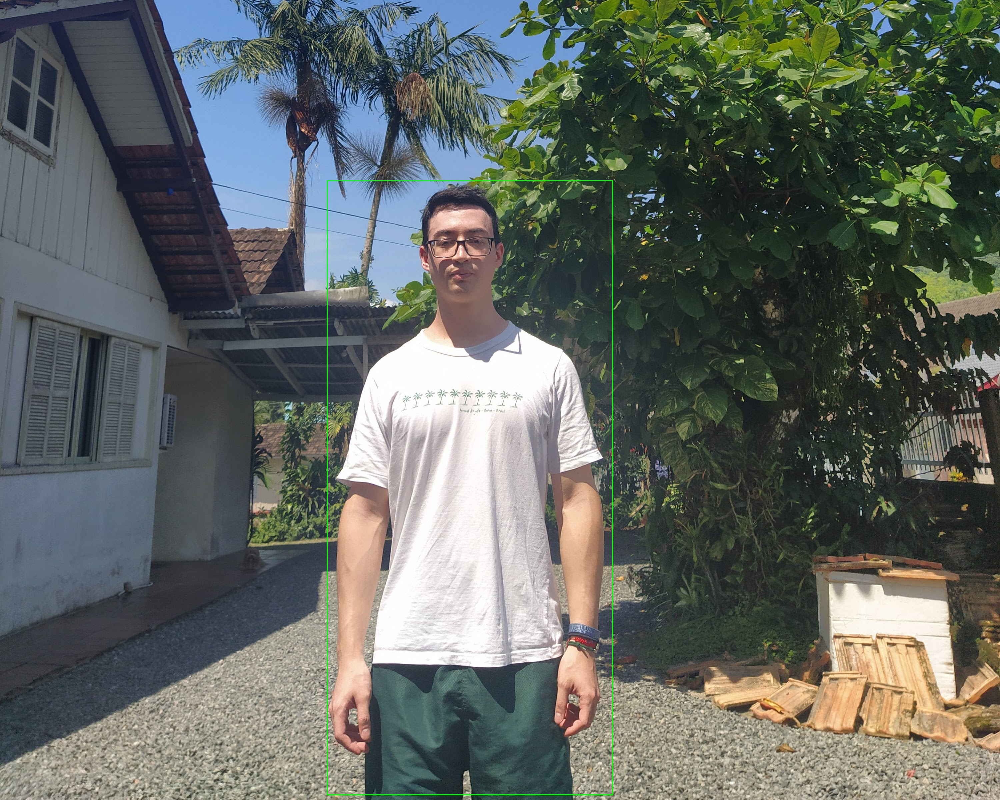